In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import anndata as ad
import pandas as pd
import cellcharter as cc
import matplotlib.pyplot as plt
from matplotlib import cm
import numpy as np
import scanpy as sc
import squidpy as sq

 captum (see https://github.com/pytorch/captum).
Global seed set to 0


In [3]:
adata = ad.read_h5ad('data/cosmx_human_nsclc/cosmx_human_nsclc_scVI_nhood3.h5ad')

In [4]:
adata.uns['spatial'] = {s: {} for s in adata.obs['sample'].unique()}

In [5]:
autok = cc.tl.ClusterAutoK.load('data/cosmx_human_nsclc/cosmx_human_nsclc_scVI_nhood3_autok')

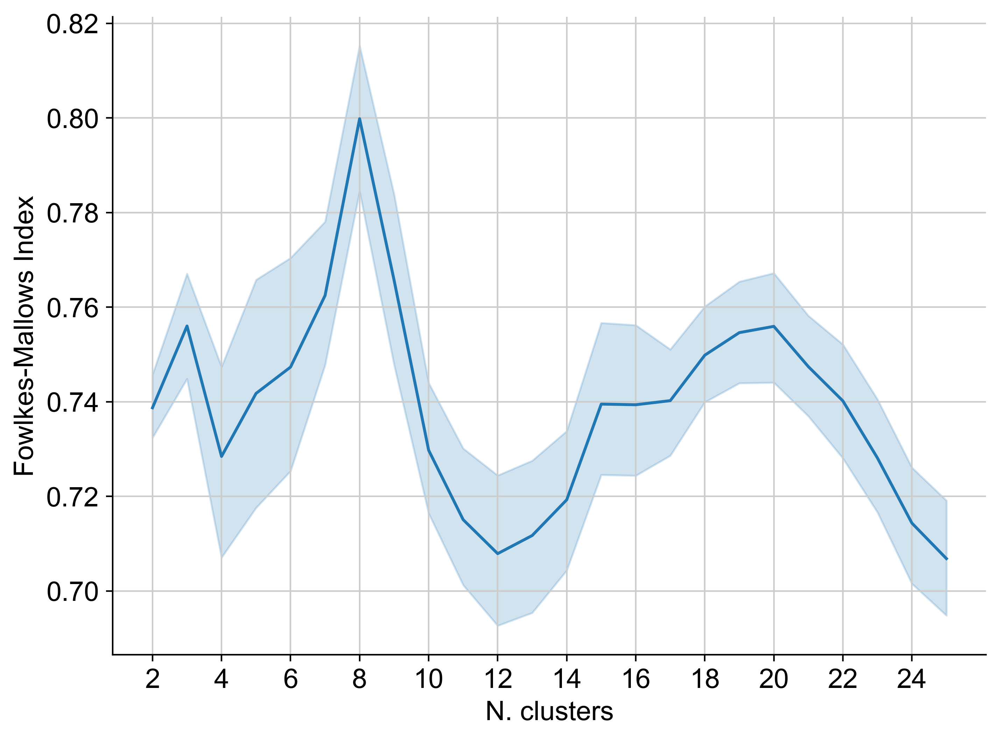

In [6]:
plt.figure(figsize=(8,6))
cc.pl.autok_stability(autok)
plt.xticks(np.arange(autok.n_clusters[1], autok.n_clusters[-1], 2))
plt.ylabel('Fowlkes-Mallows Index')
plt.show()

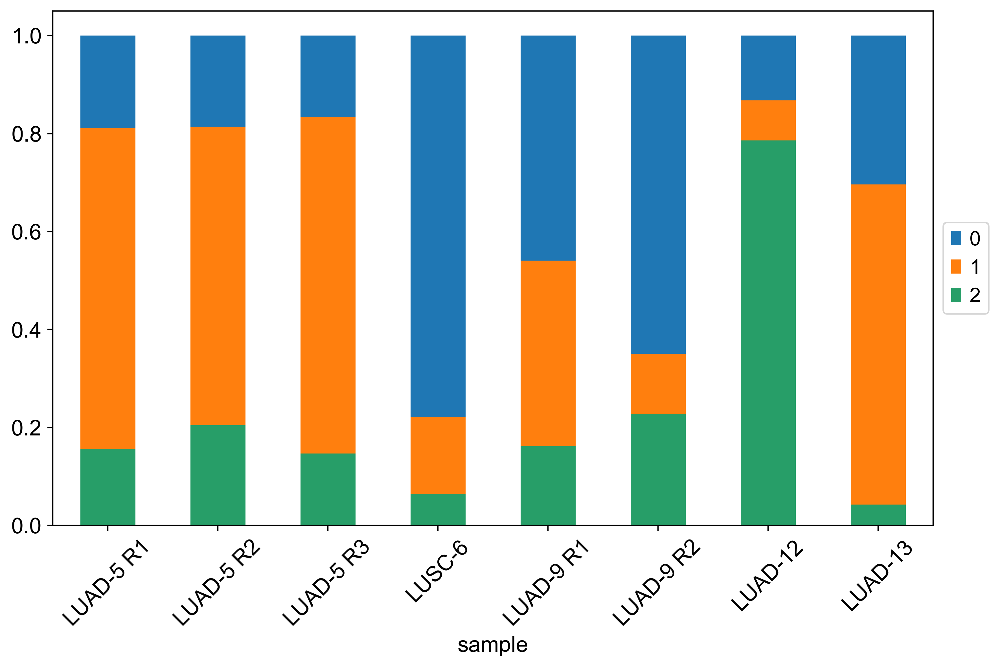

In [7]:
cc.pl.proportion(
    adata,
    group_key='sample',
    label_key=f'cluster_3',
    figsize=(10, 6),
    
)

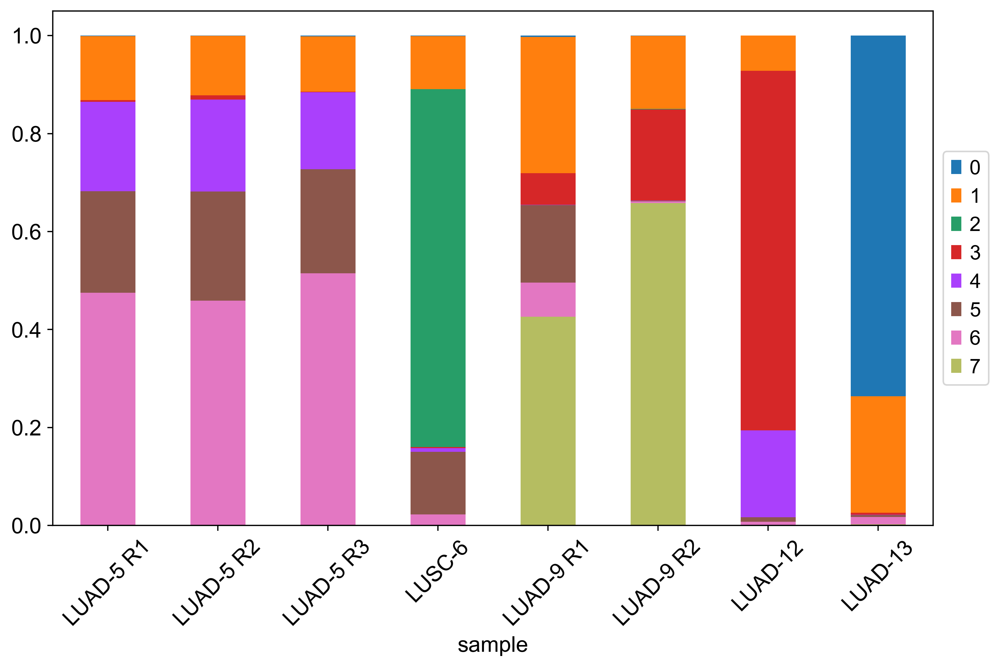

In [8]:
cc.pl.proportion(
    adata,
    group_key='sample',
    label_key=f'cluster_8',
    figsize=(10, 6),
    
)

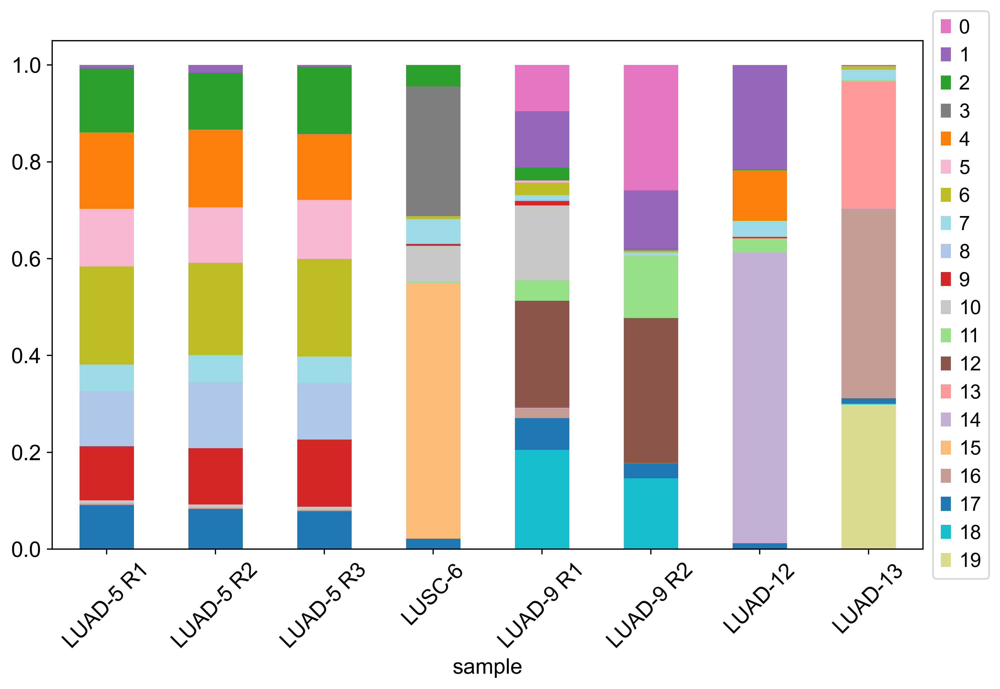

In [9]:
cc.pl.proportion(
    adata,
    group_key='sample',
    label_key=f'cluster_20',
    figsize=(10, 6),
    palette=list(adata.uns['cluster_20_colors']),
)

In [10]:
# Tumor cells are annotated based on clustering and are named based on the patient the cluster is most abundant in.
# Change the tumor cell annotation to really be based on the patient.

adata.obs['cell_type_reduced'] = adata.obs['cell_type'].replace({
    'tumor 5': 'tumor',
    'tumor 6': 'tumor',
    'tumor 9': 'tumor',
    'tumor 12': 'tumor',
    'tumor 13': 'tumor'
})

patient2tumor = {
    'Lung5': 'tumor 5',
    'Lung6': 'tumor 6',
    'Lung9': 'tumor 9',
    'Lung12': 'tumor 12',
    'Lung13': 'tumor 13'
}

for patient in adata.obs['patient'].cat.categories:
    adata.obs['cell_type'][(adata.obs['cell_type_reduced'] == 'tumor') & (adata.obs['patient'] == patient)] = patient2tumor[patient]

In [11]:
sample2sample = {
    'LUAD-5 R1': "LUAD-5",
    'LUAD-5 R2': "LUAD-5",
    'LUAD-5 R3': "LUAD-5",
    'LUSC-6': "LUSC-6",
    'LUAD-9 R1': "LUAD-9 R1",
    'LUAD-9 R2': "LUAD-9 R2",
    'LUAD-12': "LUAD-12",
    'LUAD-13': "LUAD-13",
}
adata.obs['sample_merged'] = adata.obs['sample'].map(sample2sample).astype('category')

In [12]:
type2type = {c: c for c in adata.obs['cell_type'].cat.categories}
type2type['tumor 5'] = 'LUAD-5'
type2type['tumor 6'] = 'LUSC-6'
type2type['tumor 9'] = 'LUAD-9'
type2type['tumor 12'] = 'LUAD-12'
type2type['tumor 13'] = 'LUAD-13'

In [13]:
adata.obs['cell_type'] = adata.obs['cell_type'].map(type2type)

In [14]:
cc.gr.enrichment(
    adata,
    group_key='cell_type',
    label_key='cluster_20'
)

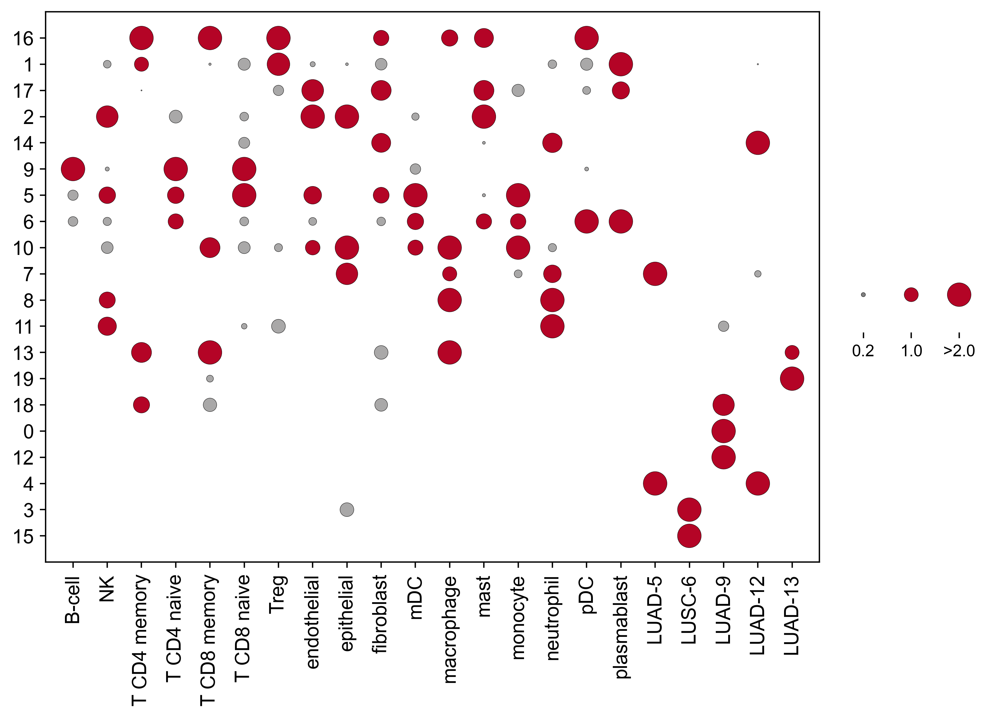

In [15]:
cc.pl.enrichment(
    adata,
    group_key='cell_type',
    label_key='cluster_20',
    cluster_labels=False,
    labels = [16, 1, 17, 2, 14, 9, 5, 6, 10, 7, 8, 11, 13, 19, 18, 0, 12, 4, 3, 15],
    figsize=(10, 6),
    size_threshold=2,
    color_threshold=1.
)

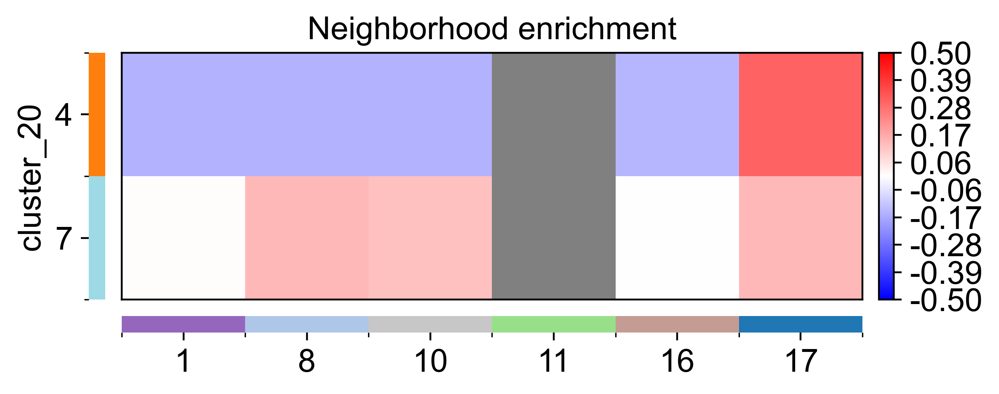

In [16]:
adata_sample = adata[adata.obs['patient'] == 'Lung5']
cc.gr.nhood_enrichment(
    adata_sample,
    cluster_key = 'cluster_20'
)

cc.pl.nhood_enrichment(
    adata_sample,
    cluster_key='cluster_20',
    row_groups=[4, 7],
    col_groups=[1, 8, 10, 11, 16, 17],
    vmin=-0.5, vmax=0.5,
    min_freq=0.001,
    transpose=True
)

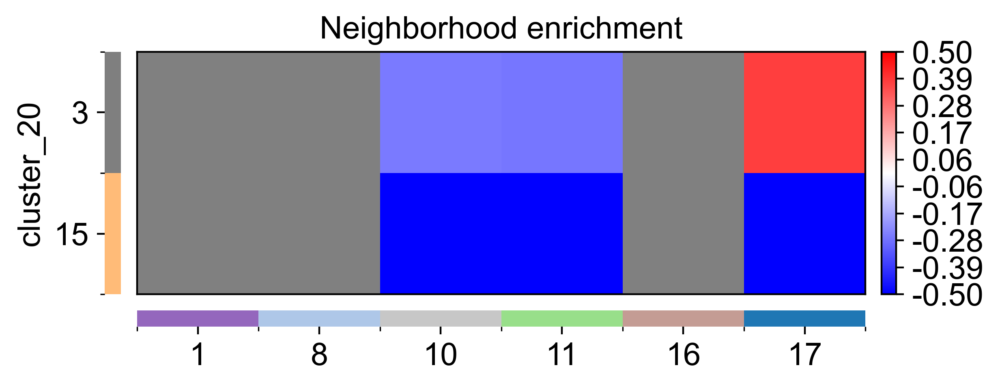

In [17]:
adata_sample = adata[adata.obs['patient'] == 'Lung6']
cc.gr.nhood_enrichment(
    adata_sample,
    cluster_key = 'cluster_20'
)

cc.pl.nhood_enrichment(
    adata_sample,
    cluster_key='cluster_20',
    row_groups=[3, 15],
    col_groups=[1, 8, 10, 11, 16, 17],
    vmin=-0.5, vmax=0.5,
    min_freq=0.001,
    transpose=True
)

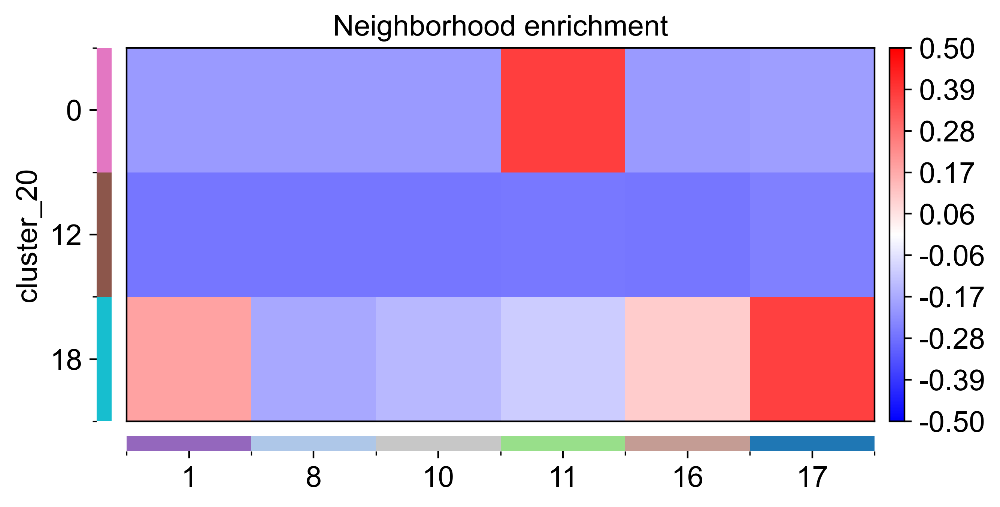

In [18]:
adata_sample = adata[adata.obs['patient'] == 'Lung9']
cc.gr.nhood_enrichment(
    adata_sample,
    cluster_key = 'cluster_20'
)

cc.pl.nhood_enrichment(
    adata_sample,
    cluster_key='cluster_20',
    row_groups=[0, 12, 18],
    col_groups=[1, 8, 10, 11, 16, 17],
    vmin=-0.5, vmax=0.5,
    min_freq=0.001,
    transpose=True
)

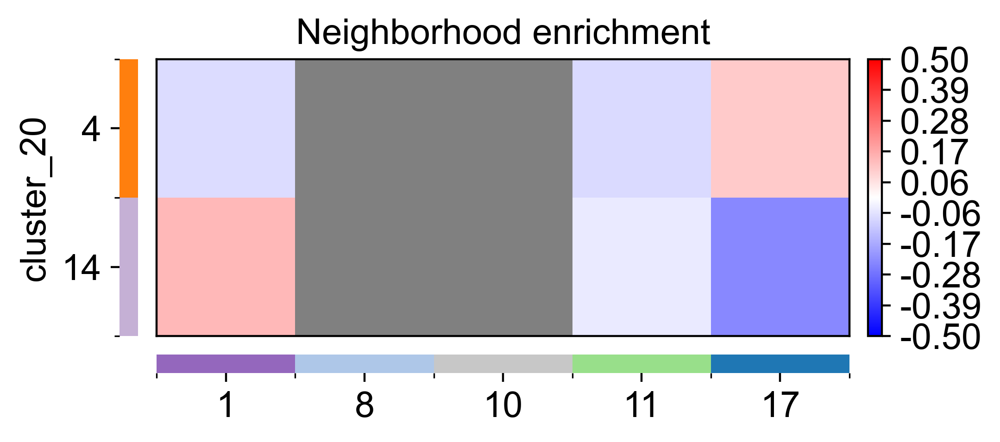

In [19]:
adata_sample = adata[adata.obs['patient'] == 'Lung12']
cc.gr.nhood_enrichment(
    adata_sample,
    cluster_key = 'cluster_20'
)

cc.pl.nhood_enrichment(
    adata_sample,
    cluster_key='cluster_20',
    row_groups=[4, 14],
    col_groups=[1, 8, 10, 11, 16, 17],
    vmin=-0.5, vmax=0.5,
    min_freq=0.001,
    transpose=True
)

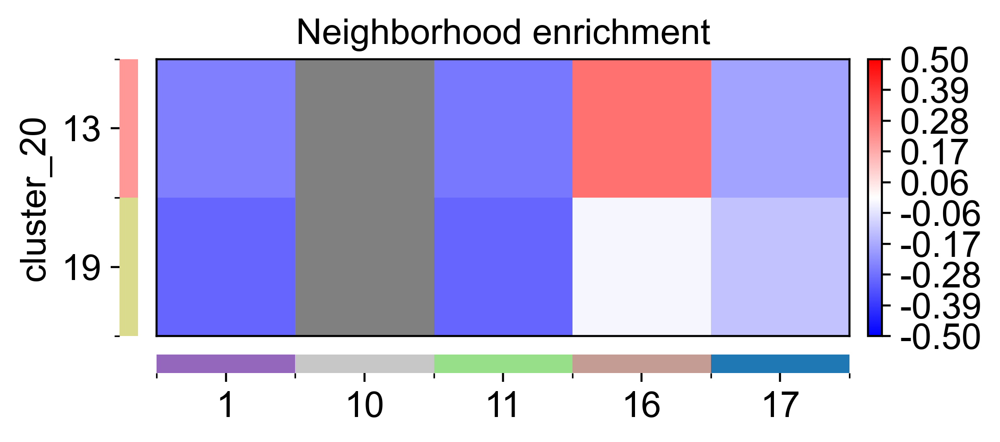

In [20]:
adata_sample = adata[adata.obs['patient'] == 'Lung13']
cc.gr.nhood_enrichment(
    adata_sample,
    cluster_key = 'cluster_20'
)

cc.pl.nhood_enrichment(
    adata_sample,
    cluster_key='cluster_20',
    row_groups=[13, 19],
    col_groups=[1, 8, 10, 11, 16, 17],
    vmin=-0.5, vmax=0.5,
    min_freq=0.001,
    transpose=True
)

In [21]:
signatures = pd.read_excel('data/tumor_cell_state_signatures_gavish.xlsx')
signatures.columns = [c.replace('/', '').replace('  ', '_').replace(' - ', '-').replace(' ', '_') for c in signatures.columns]
signatures_dict = signatures.to_dict(orient='list')

In [22]:
signatures_dict['Cell_Proliferation'] = [x for x in pd.concat((
        signatures['MP1_Cell_Cycle-G2M'],
        signatures['MP2_Cell_Cycle-G1S'],
        signatures['MP3_Cell_Cylce_HMG-rich'],
        signatures['MP4_Cell_Cylce_Chromatin_']
    ))
               if x in adata.var_names]

In [23]:
signatures_dict['GO_Cytokine_Cytokine_Receptor_Interaction']= ['VEGFA', 'CXCL1', 'CXCL3', 'CXCR4', 'PDGFA', 'CXCL8', 'CXCL2', 'TNF', 'CCL20']

In [24]:
def score_cells(adata, signature_name, genes):
    adata.obs[f'score_{signature_name}'] = np.nan
    for patient in adata.obs['patient'].cat.categories:
        adata_patient = adata[adata.obs['patient'] == patient].copy()
        sc.tl.score_genes(adata_patient, gene_list=[x for x in genes if x in adata_patient.var_names], score_name=f'score_{signature_name}')
        adata.obs[f'score_{signature_name}'][adata.obs['patient'] == patient] = adata_patient.obs[f'score_{signature_name}']

In [25]:
def smooth_signature(adata, signature_name, n_neighbors, group_key=None, groups=None):
    if groups:
        adata_groups = adata[adata.obs[group_key].isin(groups)]
    sq.gr.spatial_neighbors(adata_groups, library_key='sample', n_neighs=n_neighbors, coord_type='generic')
    adata_groups.obsp['spatial_connectivities'].setdiag(1)
    
    adata.obs[f'score_{signature_name}_smoothed'] = np.nan
    for patient in adata_groups.obs['patient'].cat.categories:
        adata_groups_patient = adata_groups[adata_groups.obs['patient'] == patient]
        adata_groups_patient.obs[f'score_{signature_name}_smoothed'] = np.nan*np.ones(adata_groups_patient.shape[0])
        adj = adata_groups_patient.obsp['spatial_connectivities']
        score_smoothed = (adj @ adata_groups_patient.obs[f'score_{signature_name}']) / np.array(np.sum(adj, axis=1)).squeeze()
        score_smoothed[score_smoothed == float('inf')] = 0

        low = np.nanpercentile(score_smoothed, 5)
        score_smoothed[score_smoothed < low] = low

        high = np.nanpercentile(score_smoothed, 95)
        score_smoothed[score_smoothed > high] = high

        adata.obs[f'score_{signature_name}_smoothed'][(adata.obs['patient'] == patient) & (adata.obs[group_key].isin(groups))] = score_smoothed
    

In [26]:
signatures_names  = ['GO_Cytokine_Cytokine_Receptor_Interaction', 'MP13_EMT-II', 'MP6_Hypoxia', 'Cell_Proliferation']

In [27]:
for SIGNATURE_NAME in signatures_names:
    score_cells(adata, SIGNATURE_NAME, signatures_dict[SIGNATURE_NAME])
    smooth_signature(adata, SIGNATURE_NAME, 50, 'cell_type_reduced', ['tumor'])

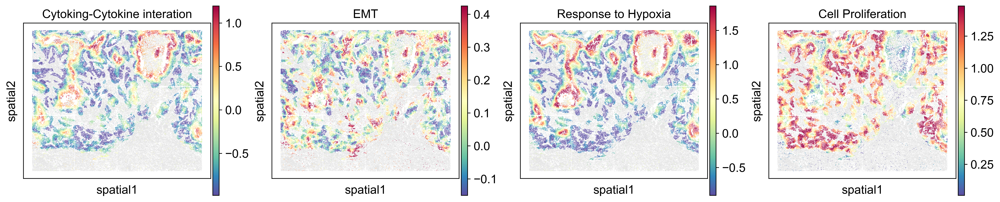

In [28]:
adata_sample = adata[adata.obs['sample'] == 'LUAD-9 R1'].copy()
adata_sample.obsm['spatial'][:, 1] = np.max(adata_sample.obsm['spatial'][:, 1]) - adata_sample.obsm['spatial'][:, 1]

sq.pl.spatial_scatter(
    adata_sample,
    color=[f'score_{signature}_smoothed' for signature in signatures_names],
    cmap='Spectral_r',
    library_key='sample',
    library_id='LUAD-9 R1',
    img=None,
    size=30,
    na_color="#E5E5E5",
    ncols=4,
    title=['Cytoking-Cytokine interation', 'EMT', 'Response to Hypoxia', 'Cell Proliferation'],
    legend_loc=False,
)
plt.show()